# Canny edge detection Algorithm

Canny Edge Detection is based on the following steps:
1. Grayscale Conversion
2. Noise Reduction (Gaussian Filter)
3. Determining Intensity Gradients (Vertical and Horizontal Kernals(Sobel Filter))
4. Non_Max Supression
5. Edge Tracing by Double Thresholding Hysteresis

# code

In [58]:
import numpy as np
import cv2
from scipy import ndimage
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [59]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(12, 10), dpi=80, facecolor='w', edgecolor='k')

<Figure size 960x800 with 0 Axes>

<Figure size 960x800 with 0 Axes>

# 1. Grayscale conversion

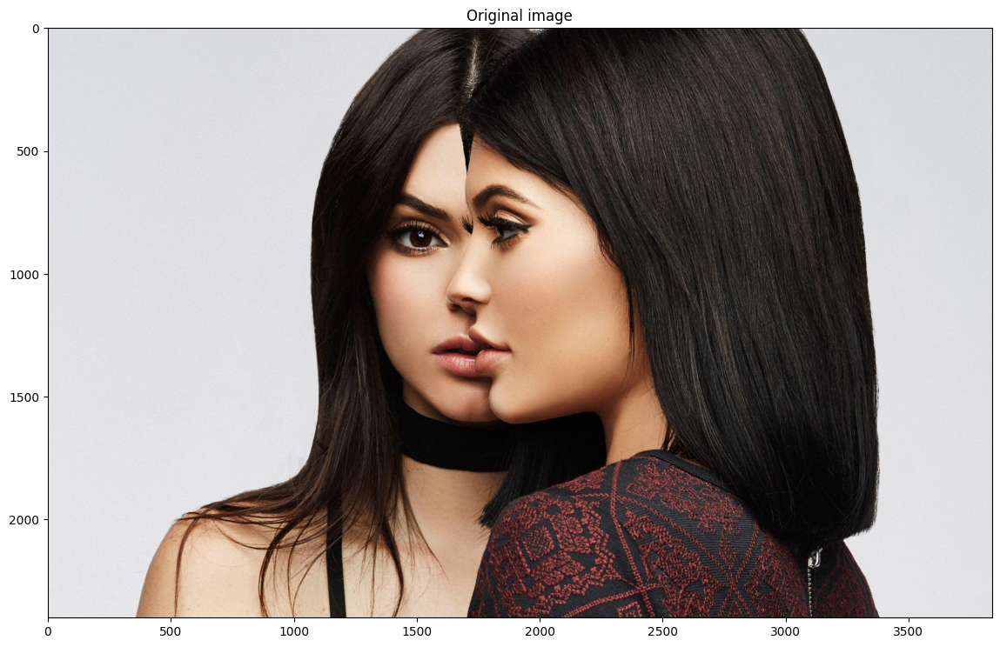

In [60]:
imgcolor = cv2.imread('/kaggle/input/secondpic/kyliejenner two.jpeg')
plt.figure(figsize = (14,10))
plt.imshow(imgcolor[...,::-1])
plt.title('Original image')
plt.show()

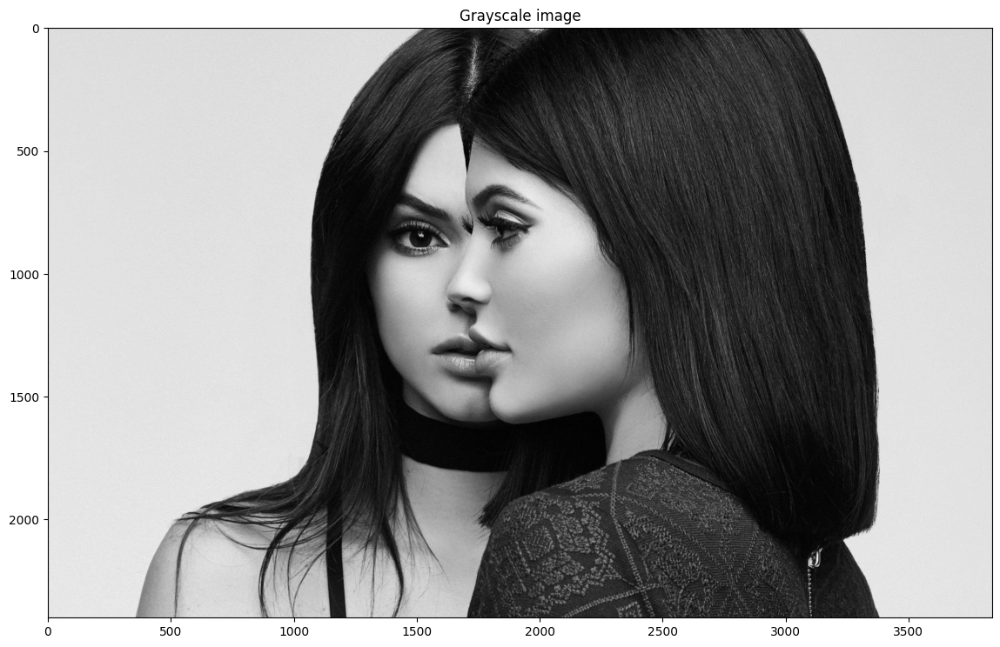

In [61]:
imggray = cv2.cvtColor(imgcolor, cv2.COLOR_BGR2GRAY)
imggray = imggray/(np.max(imggray)/8)
plt.figure(figsize = (14,10))
plt.imshow(imggray,cmap = plt.get_cmap('gray'))
plt.title('Grayscale image')
plt.show()

# 2. Noise Reduction

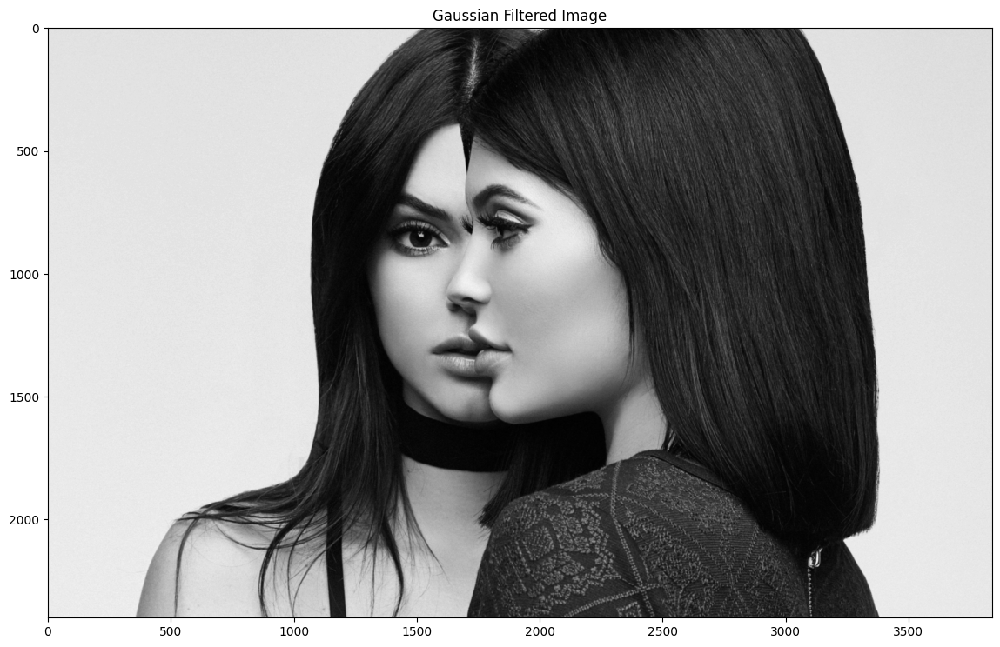

In [62]:
imgblur = cv2.GaussianBlur(imggray,(5,5),0)
plt.figure(figsize = (14,10))
plt.imshow(imgblur, cmap = plt.get_cmap('gray'))
plt.title("Gaussian Filtered Image")
plt.show()

# 3. Intensity Gradients

In [63]:
gtx = np.array([[1,0,-1],[2,0,-2],[1,0,-1]])
Gx = ndimage.convolve(imgblur, gtx)

gty = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])
Gy = ndimage.convolve(imgblur, gty)

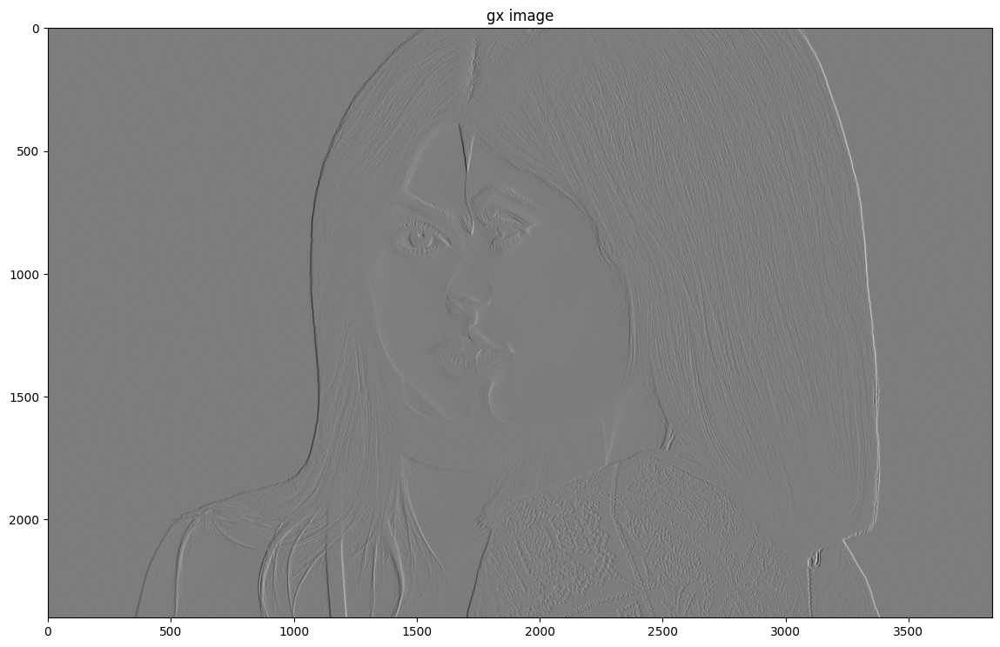

In [64]:
plt.figure(figsize = (14,10))
plt.imshow(Gx, cmap = plt.get_cmap('gray'))
plt.title('gx image')
plt.show()

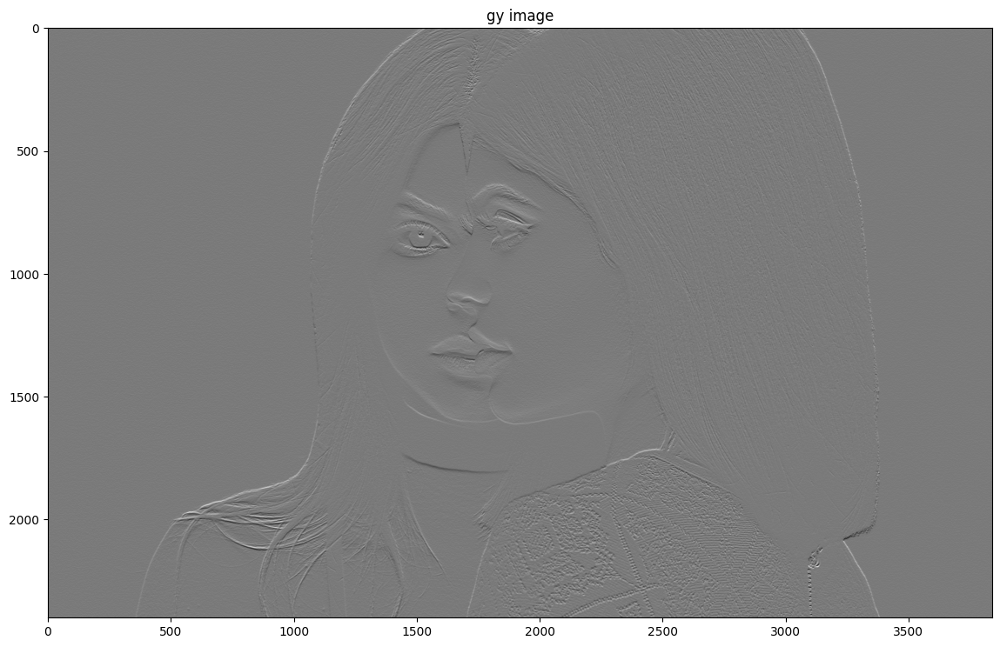

In [65]:
plt.figure(figsize = (14,10))
plt.imshow(Gy, cmap = plt.get_cmap('gray'))
plt.title('gy image')
plt.show()

Gradient magnitude and direction 
* |G| = sqr(gx^2 + gy^2)
* ang(G)=arctan(gy/gx)

In [68]:
Gmag = np.hypot(Gx,Gy)
Gangle = np.degrees(np.arctan2(Gy,Gx))

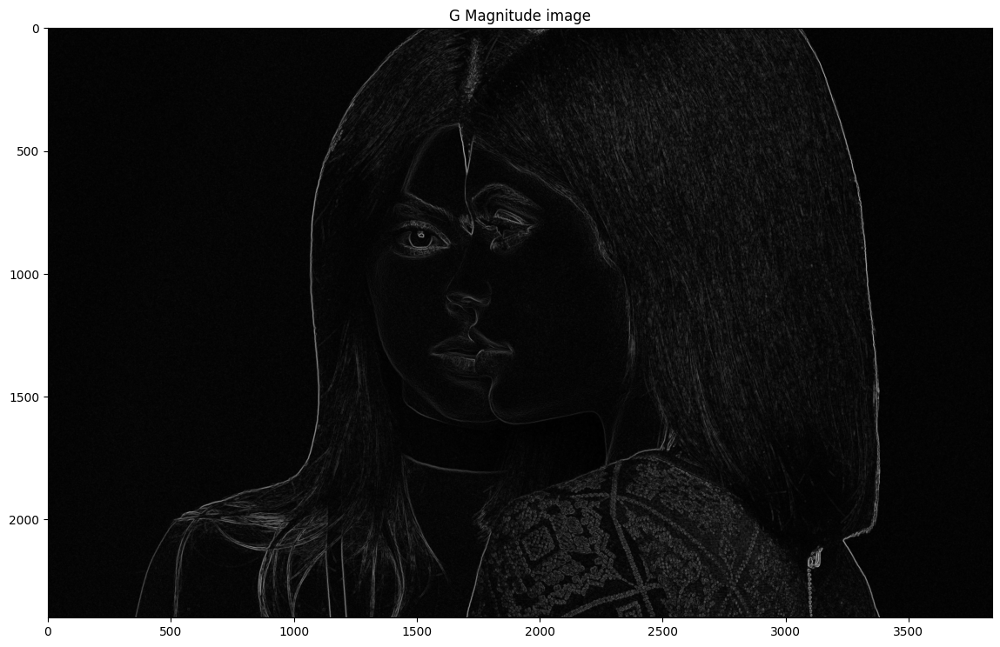

In [69]:
plt.figure(figsize = (14,10))
plt.imshow(Gmag, cmap = plt.get_cmap('gray'))
plt.title('G Magnitude image')
plt.show()

# 4. Non max supression

In [70]:
M, N = Gmag.shape
Gnms = np.zeros((M,N))

for i in range(1, M-1):
    for j in range(1, N-1):
        
        if((Gangle[i,j] >= 0 and Gangle[i,j] <= 45) or (Gangle[i,j] < -135 and Gangle[i,j] >= -180)):
            
            yBottom = np.array([Gmag[i,j+1], Gmag[i+1,j+1]])
            yTop = np.array([Gmag[i,j-1], Gmag[i-1,j-1]])
            x_est = np.absolute(Gy[i,j]/Gmag[i,j])
            
            if (Gmag[i,j] >= ((yBottom[1]-yBottom[0])*x_est+yBottom[0]) and Gmag[i,j] >= ((yTop[1]-yTop[0])*x_est+yTop[0])):
                Gnms[i,j] = Gmag[i,j]
            else:
                Gnms[i,j] = 0
                
        if((Gangle[i,j] > 45 and Gangle[i,j] <= 90) or (Gangle[i,j] < -90 and Gangle[i,j] >= -135)):
            
            yBottom = np.array([Gmag[i+1,j] ,Gmag[i+1,j+1]])
            yTop = np.array([Gmag[i-1,j] ,Gmag[i-1,j-1]])
            x_est = np.absolute(Gx[i,j]/Gmag[i,j])
            
            if (Gmag[i,j] >= ((yBottom[1]-yBottom[0])*x_est+yBottom[0]) and Gmag[i,j] >= ((yTop[1]-yTop[0])*x_est+yTop[0])):
                Gnms[i,j] = Gmag[i,j]
            else:
                Gnms[i,j] = 0
                
        if((Gangle[i,j] > 90 and Gangle[i,j] <= 135) or (Gangle[i,j] < -45 and Gangle[i,j] >= -90)):
            
            yBottom = np.array([Gmag[i+1,j] ,Gmag[i+1,j-1]])
            yTop = np.array([Gmag[i-1,j] ,Gmag[i-1,j+1]])
            x_est = np.absolute(Gx[i,j]/Gmag[i,j])
            
            if (Gmag[i,j] >= ((yBottom[1]-yBottom[0])*x_est+yBottom[0]) and Gmag[i,j] >= ((yTop[1]-yTop[0])*x_est+yTop[0])):
                Gnms[i,j] = Gmag[i,j]
            else:
                Gnms[i,j] = 0
                
        if((Gangle[i,j] > 135 and Gangle[i,j] <= 180) or (Gangle[i,j] < 0 and Gangle[i,j] >= -45)):
            
            yBottom = np.array([Gmag[i,j-1] ,Gmag[i+1,j-1]])
            yTop = np.array([Gmag[i,j+1] ,Gmag[i-1,j+1]])
            x_est = np.absolute(Gy[i,j]/Gmag[i,j])
            
            if (Gmag[i,j] >= ((yBottom[1]-yBottom[0])*x_est+yBottom[0]) and Gmag[i,j] >= ((yTop[1]-yTop[0])*x_est+yTop[0])):
                Gnms[i,j] = Gmag[i,j]
            else:
                Gnms[i,j] = 0

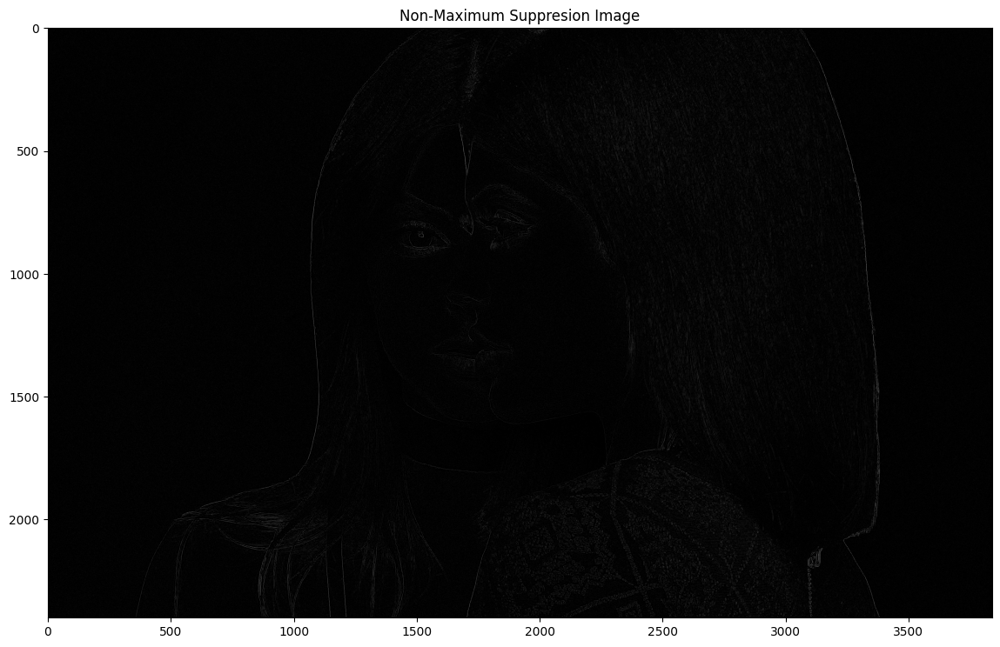

In [71]:
plt.figure(figsize = (14,10))
plt.imshow(Gnms, cmap = plt.get_cmap('gray'))
plt.title('Non-Maximum Suppresion Image')
plt.show()

# 5. Hysteresis Thresholding

In [72]:
highThresholdRatio = 0.2  
lowThresholdRatio = 0.1
weak_pixel=75
strong_pixel=255

highThreshold = Gnms.max() * highThresholdRatio;
lowThreshold = highThreshold * lowThresholdRatio;

M, N = Gnms.shape
Gthres = np.zeros((M,N), dtype=np.int32)

weak = np.int32(weak_pixel)
strong = np.int32(strong_pixel)

strong_i, strong_j = np.where(Gnms >= highThreshold)
zeros_i, zeros_j = np.where(Gnms < lowThreshold)

weak_i, weak_j = np.where((Gnms <= highThreshold) & (Gnms >= lowThreshold))

Gthres[strong_i, strong_j] = strong
Gthres[weak_i, weak_j] = weak

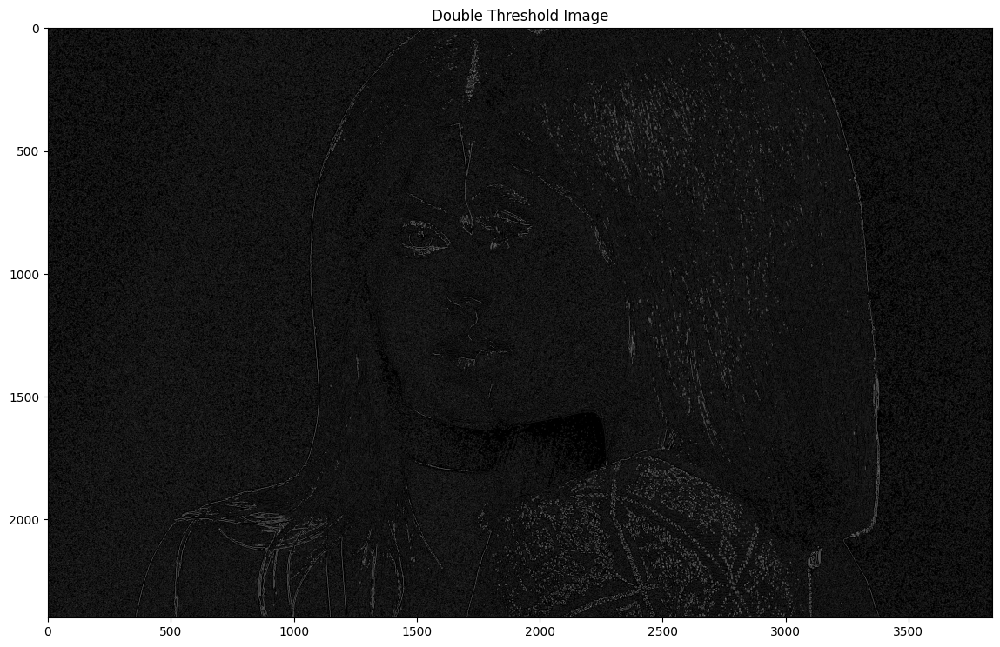

In [73]:
plt.figure(figsize = (14,10))
plt.imshow(Gthres, cmap = plt.get_cmap('gray'))
plt.title('Double Threshold Image')
plt.show()

In [74]:
imgEdges = Gthres
M, N = Gthres.shape
weak = weak_pixel
strong = strong_pixel

for i in range(1, M-1):
    for j in range(1, N-1):
        if (imgEdges[i,j] == weak):
            try:
                if ((imgEdges[i+1, j-1] == strong) or (imgEdges[i+1, j] == strong) or (imgEdges[i+1, j+1] == strong)
                    or (imgEdges[i, j-1] == strong) or (imgEdges[i, j+1] == strong)
                    or (imgEdges[i-1, j-1] == strong) or (imgEdges[i-1, j] == strong) or (imgEdges[i-1, j+1] == strong)):
                    imgEdges[i, j] = strong
                else:
                    imgEdges[i, j] = 0
            except IndexError as e:
                pass

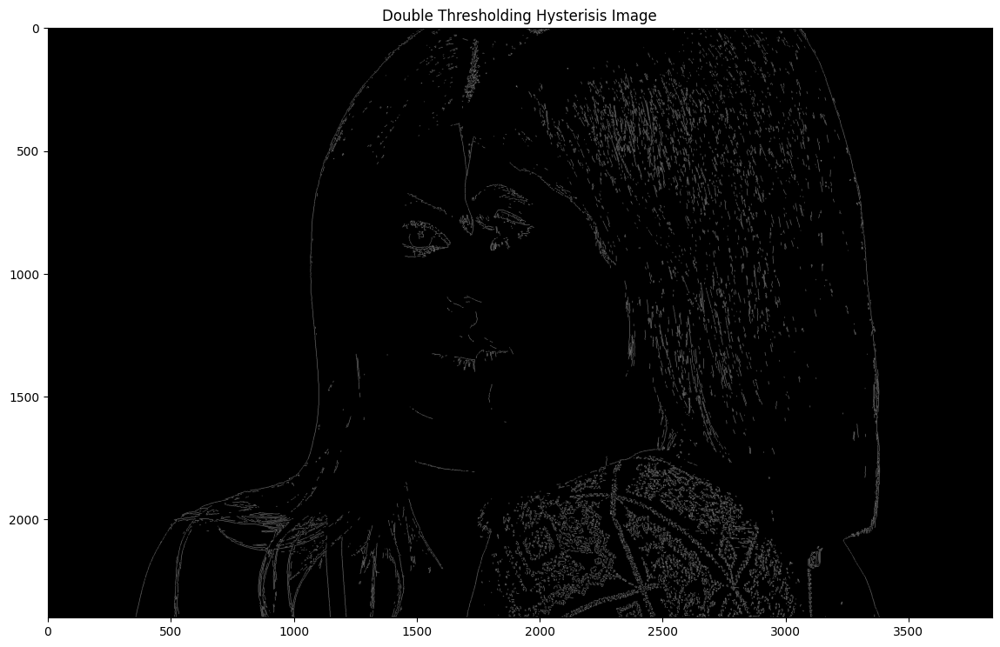

In [75]:
plt.figure(figsize = (14,10))
plt.imshow(imgEdges, cmap = plt.get_cmap('gray'))
plt.title('Double Thresholding Hysterisis Image')
plt.show()

# Using OpenCV

In [78]:
cvImgGray = cv2.imread('/kaggle/input/secondpic/kyliejenner two.jpeg',0)
edges = cv2.Canny(cvImgGray,100,200, True)

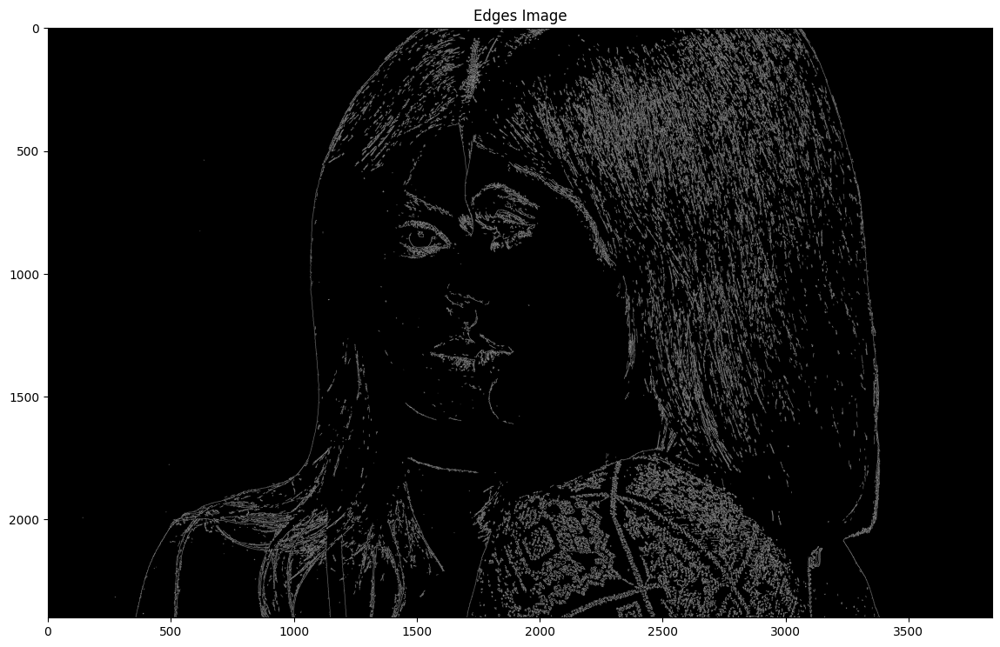

In [79]:
plt.figure(figsize = (14,10))
plt.imshow(edges, cmap = plt.get_cmap('gray'))
plt.title('Edges Image')
plt.show()

In [80]:
cvImgGray = cv2.imread('/kaggle/input/secondpic/kyliejenner two.jpeg',0)
edges = cv2.Canny(cvImgGray,100,100, True)

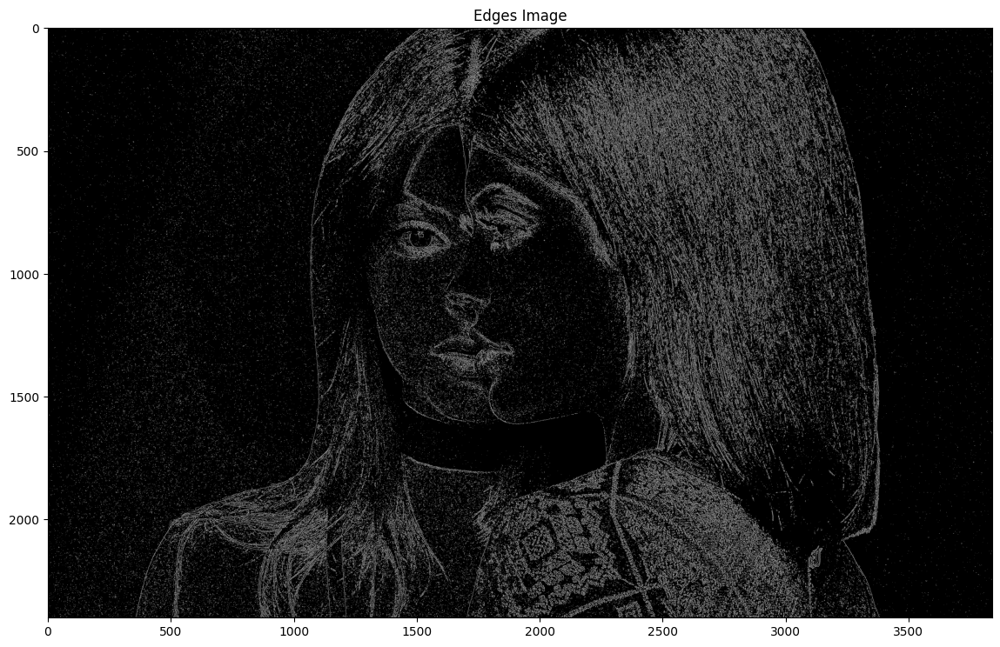

In [81]:
plt.figure(figsize = (14,10))
plt.imshow(edges, cmap = plt.get_cmap('gray'))
plt.title('Edges Image')
plt.show()

In [90]:
cvImgGray = cv2.imread('/kaggle/input/secondpic/kyliejenner two.jpeg',0)
edges = cv2.Canny(cvImgGray,75,150, True)

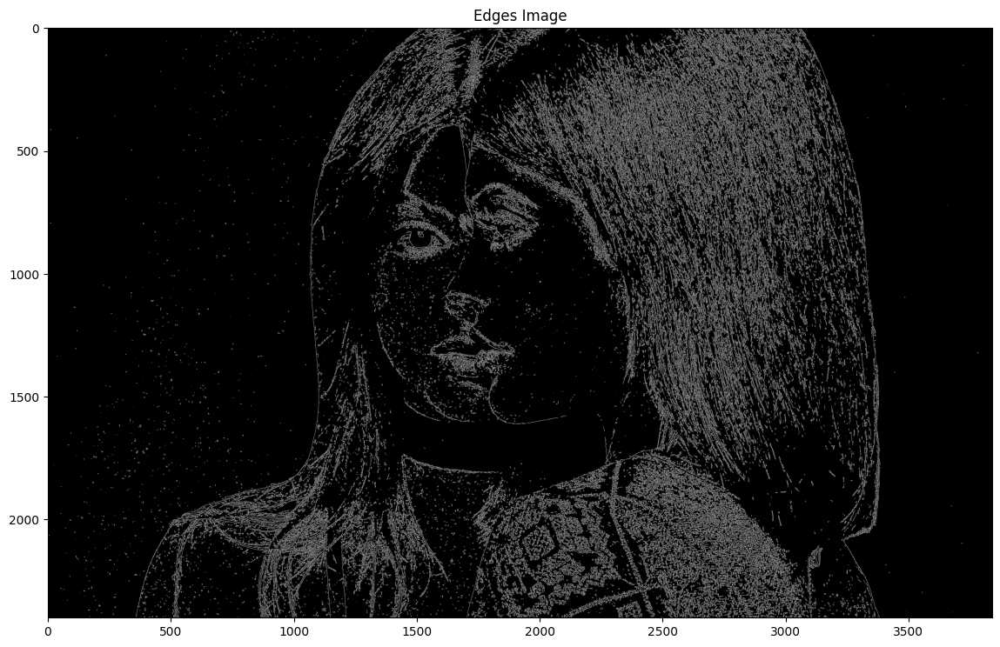

In [91]:
plt.figure(figsize = (14,10))
plt.imshow(edges, cmap = plt.get_cmap('gray'))
plt.title('Edges Image')
plt.show()

# example buildings


In [92]:
cvImgGray = cv2.imread('/kaggle/input/buildings/360_F_281897358_3rj9ZBSZHo5s0L1ug7uuIHadSxh9Cc75.webp',0)
edges = cv2.Canny(cvImgGray,75,150, True)

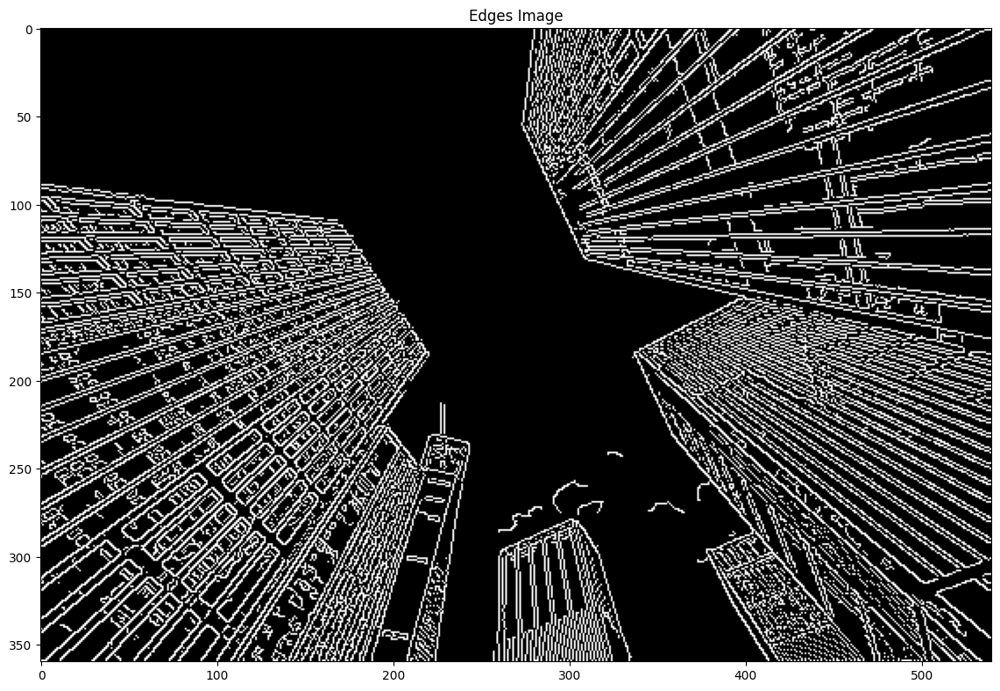

In [93]:
plt.figure(figsize = (14,10))
plt.imshow(edges, cmap = plt.get_cmap('gray'))
plt.title('Edges Image')
plt.show()

In [104]:
cvImgGray = cv2.imread('/kaggle/input/buildings/360_F_281897358_3rj9ZBSZHo5s0L1ug7uuIHadSxh9Cc75.webp',0)
edges = cv2.Canny(cvImgGray,500,500, True)

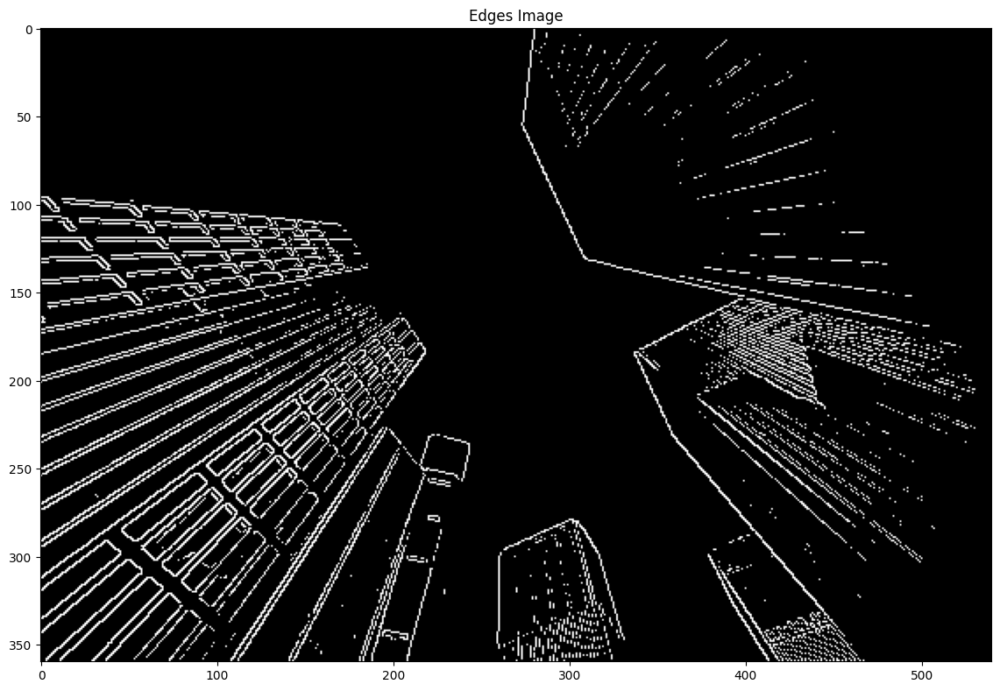

In [105]:
plt.figure(figsize = (14,10))
plt.imshow(edges, cmap = plt.get_cmap('gray'))
plt.title('Edges Image')
plt.show()